In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'yolo-coco-data:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F253570%2F562374%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T184457Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5b017c5c65683af4aa3649f40b42062e38bcef1f1468e2d689bb574e87930e5709ebdf7413362b7a697c7695d1c9be2400dff96e2352d2748500744c081037e965c572be6e5fdeedeaea2bfd4ed638ac75ae9b67b7b981cf59494e25c41c3b544e8e68eb3c8217bd174c0c67f98a97b672feba6e7c4dc45838fedd3733d4fa8785265e66beba732b9cd80b7e0ab4aef3379104550f2d2168d9be90926a822624fc82a55ecada8931ce26a5660d14daa298ce3a821fda9bb6a302895b1fae491c17b91c2e0ad3279c528d950207949d0841a50ab9b8795cbb58a4183a242ef0f50b4f5bde97833c3ae71161ad7d1e97a69b3393a4672103bb87092f52b62a9f68,car-object-detection:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F843852%2F3866417%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T184457Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D214813ea6e05013e4a80ba0fba81ec81b7ceb568ec190d564ae90d04a0e8c7746ea5ce0b6260ce172b63bcb789da47eb1bddf0dccf311713ad68584f92b0abc4ec228c54544abdc19defa144d910941c73f69a805acada64f2da3a309c22906e434615fad4b6e535b64e45691551ac9cc0a368acafe62f8bddcf511d29ef0cb71ad27280263f5d2c9cf3e19a122daf72e4b565053c635624a2084678146ac5a68794e6dc2691c37e830a9c86ae1426b9e63dedb380daee53c9edb7107d51c82b850b9d70502a5a50f1b688aae59bdd5ead4cb430b35c04edbf1d9fd1cb89e033659276c826f8b076cfafc5a86388ae6080931133507a31887e0dd4387fb00749'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 230548020 bytes downloaded
Downloaded and uncompressed: yolo-coco-data
[==================================================] 117507383 bytes downloaded
Downloaded and uncompressed: car-object-detection
Data source import complete.


In [ ]:
# Common
import os
import random
import cv2 as cv
import numpy as np
import pandas as pd
from IPython.display import clear_output as cls

# Data
import tensorflow as tf
from tqdm import tqdm
import tensorflow.data as tfd

# Data Visualization
import matplotlib.pyplot as plt

In [ ]:
# Hyperparams
IMAGE_HEIGHT = 380
IMAGE_WIDTH = 676
IMAGE_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)

# Constants
TRAIN_ROOT_DIR = '/kaggle/input/car-object-detection/data/training_images/'
TEST_ROOT_DIR = '/kaggle/input/car-object-detection/data/testing_images/'
TRAIN_CSV_PATH = '/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv'

# Threshold values
PROB_THRESH = 0.9
IoU_THRESH = 0.5

# Class names.
f = open('/kaggle/input/yolo-coco-data/coco.names', 'rb')
labels = list(n.decode('UTF-8').replace('\n', ' ').strip() for n in f.readlines())

In [ ]:
# Random Seed
SEED = 42
np.random.seed(SEED)

In [ ]:
# Load metadata
metadata = pd.read_csv(TRAIN_CSV_PATH)

# Quick look
metadata.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [ ]:
def load_image(file_name: str, ROOT_PATH: str) -> tf.Tensor:
    '''
    Loads an image from the file path provided, performs necessary preprocessing steps, and returns the image as a tensor.

    Args:
        file_name (str): Name of the image file to load.
        ROOT_PATH (str): Root directory where the image file is stored.

    Returns:
        image (tf.Tensor): Tensor representing the loaded image, normalized between 0 and 1, with data type float32.
    '''

    # Obtain the complete path to the image file
    image_path = os.path.join(ROOT_PATH, file_name)

    # Read the image file
    image = tf.io.read_file(image_path)

    # Decode the image to tensor with 3 channels
    image = tf.image.decode_jpeg(image, channels=3)

    # Convert the image data type to float32
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)

    # Normalize the image to [0, 1] range
    image = tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

    return image

In [ ]:
def load_dataset(
    metadata: pd.DataFrame=metadata,
    ROOT_PATH: str=TRAIN_ROOT_DIR,
    SHUFFLE: bool=True,
    SPLIT_RATIO: float=0.1) -> tuple:

    """
    Loads and returns a dataset of images and their corresponding bounding boxes based on the provided metadata file.

    Args:
        metadata (pd.DataFrame): A pandas DataFrame containing the metadata information for the dataset.
        ROOT_PATH (str): The root path of the dataset.
        SHUFFLE (bool, optional): Whether or not to shuffle the dataset. Defaults to True.
        SPLIT_RATIO (float, optional): The ratio for splitting the dataset into training and validation sets.
            If set to None, no split is performed. Defaults to 0.1.

    Raises:
        ValueError: If SPLIT_RATIO is not between 0 and 1.
        FileNotFoundError: If the ROOT_PATH does not exist.

    Returns:
        tuple: A tuple containing the dataset images and their corresponding bounding boxes as numpy arrays.
    """

    # Check if SPLIT_RATIO is between 0 and 1.
    if SPLIT_RATIO is not None and (SPLIT_RATIO < 0 or SPLIT_RATIO > 1):
        raise ValueError("SPLIT_RATIO must be between 0 and 1.")

    # Check if the ROOT_PATH is valid and exists.
    if not os.path.exists(ROOT_PATH):
        raise FileNotFoundError(f"The ROOT_PATH {ROOT_PATH} does not exist.")

    # Collect all the image paths.
    image_paths = metadata['image']

    # Create space for storing the images and the bounding boxes
    images = np.empty(shape=(len(image_paths), *IMAGE_SIZE), dtype=np.float32)
    bounding_boxes = np.empty(shape=(len(image_paths), 4), dtype=np.float32)

    # Iterate over the image paths
    index = 0
    for image_path in tqdm(image_paths, desc="Loading"):
        try:
            # Load the image
            image = load_image(file_name = image_path, ROOT_PATH = ROOT_PATH)

            # Extract the Corner Points
            box = np.array([
                metadata['xmin'][index],
                metadata['ymin'][index],
                metadata['xmax'][index],
                metadata['ymax'][index],
            ], dtype=np.float32)

            # Add the data
            images[index] = image
            bounding_boxes[index] = box

            # Increment the index
            index  += 1
        except:
            # Raise an error if any of the image paths is invalid
            raise IndexError(f"Invalid image path: {image_path}")

    # Return complete data
    return images, bounding_boxes

In [ ]:
# Train and valid Dataset
images, bounding_boxes = load_dataset()

Loading: 100%|██████████| 559/559 [00:11<00:00, 49.60it/s]


In [ ]:
def show_images_and_bbs(data: tfd.Dataset, GRID: list=[6,3], FIGSIZE: tuple=(30,40)) -> None:
    """
    Visualizes a batch of images with their bounding boxes.

    Args:
    - data: A TensorFlow dataset.
    - GRID: A list specifying the number of rows and columns in the plot grid. Default is [6,3].
    - FIGSIZE: A tuple specifying the size of the plot. Default is (30,40).

    Returns: None
    """

    # Define bounding box color
    BB_COLOR = (0, 255, 0)

    # Plotting Configuration
    plt.figure(figsize=FIGSIZE)
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols

    # Gather the data
    images, boxes = data[0], data[1]

    # Iterate over the data
    for index, (image, box) in enumerate(zip(images, boxes)):

        # Convert the Bounding Box
        x1, y1, x2, y2 = map(int, box)

        # Add the rectangle
        image = cv.rectangle(
            img = image,
            pt1 = (x1, y1),
            pt2 = (x2, y2),
            thickness=5,
            color=BB_COLOR
        )

        # plot the image
        plt.subplot(n_rows, n_cols, index+1)
        plt.imshow(image)
        plt.axis('off')

        # Break the loop
        if (index+1)>=n_images:
            break

    # Show final plot
    plt.show()

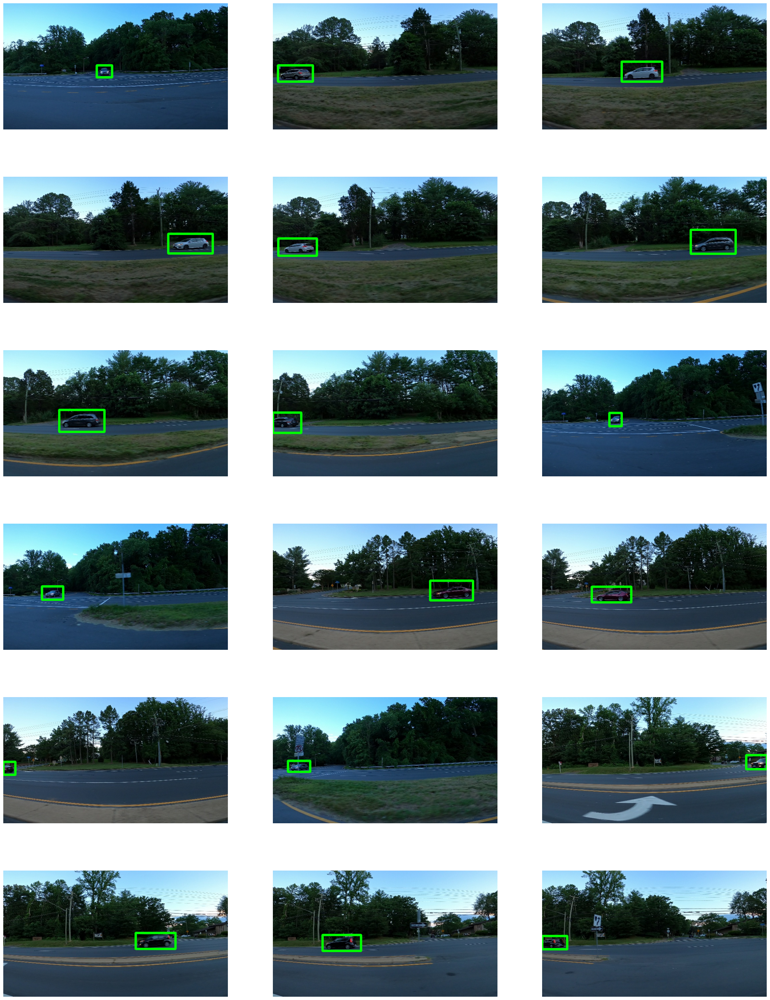

In [ ]:
# Training Data
dataset = [images, bounding_boxes]
show_images_and_bbs(data = dataset)

In [ ]:
# Initialized in Network
net = cv.dnn.readNet(
    '/kaggle/input/yolo-coco-data/yolov3.weights',
    '/kaggle/input/yolo-coco-data/yolov3.cfg')

In [ ]:
# Names of the layer
layer_names = net.getLayerNames()
print(f"Model Layer Name : \n{layer_names}")

Model Layer Name : 
('conv_0', 'bn_0', 'leaky_1', 'conv_1', 'bn_1', 'leaky_2', 'conv_2', 'bn_2', 'leaky_3', 'conv_3', 'bn_3', 'leaky_4', 'shortcut_4', 'conv_5', 'bn_5', 'leaky_6', 'conv_6', 'bn_6', 'leaky_7', 'conv_7', 'bn_7', 'leaky_8', 'shortcut_8', 'conv_9', 'bn_9', 'leaky_10', 'conv_10', 'bn_10', 'leaky_11', 'shortcut_11', 'conv_12', 'bn_12', 'leaky_13', 'conv_13', 'bn_13', 'leaky_14', 'conv_14', 'bn_14', 'leaky_15', 'shortcut_15', 'conv_16', 'bn_16', 'leaky_17', 'conv_17', 'bn_17', 'leaky_18', 'shortcut_18', 'conv_19', 'bn_19', 'leaky_20', 'conv_20', 'bn_20', 'leaky_21', 'shortcut_21', 'conv_22', 'bn_22', 'leaky_23', 'conv_23', 'bn_23', 'leaky_24', 'shortcut_24', 'conv_25', 'bn_25', 'leaky_26', 'conv_26', 'bn_26', 'leaky_27', 'shortcut_27', 'conv_28', 'bn_28', 'leaky_29', 'conv_29', 'bn_29', 'leaky_30', 'shortcut_30', 'conv_31', 'bn_31', 'leaky_32', 'conv_32', 'bn_32', 'leaky_33', 'shortcut_33', 'conv_34', 'bn_34', 'leaky_35', 'conv_35', 'bn_35', 'leaky_36', 'shortcut_36', 'conv_3

In [ ]:
# Get the output layers of the network
output_layers_names = net.getUnconnectedOutLayersNames()
output_layers_names

('yolo_82', 'yolo_94', 'yolo_106')

In [ ]:
def image_to_blob(image: np.ndarray) -> np.ndarray:
    """
    Convert an array of images into a 4D NumPy array in blob format.

    Args:
        images (np.ndarray): An array of images.

    Returns:
        np.ndarray: A 4D NumPy array in blob format, where the first dimension
        represents the number of images, the second and third dimensions represent
        the size of the images, and the fourth dimension represents the color
        channels.
    """

    # Prepare a blob of image
    blob = cv.dnn.blobFromImage(
        image = image,
        size = (416, 416),
        mean = (0, 0, 0),
        swapRB=True,
        crop=False
    )

    # Return blob
    return blob

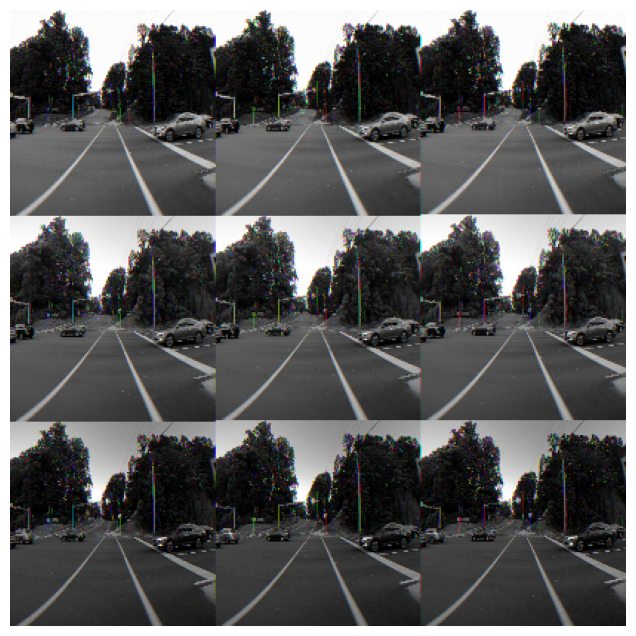

In [ ]:
# Get Image
input_img = images[random.randint(0,len(images))]

# Convert all images to blobs.
blob = image_to_blob(input_img)

# Visualize the blobs
plt.figure(figsize=(8, 8))

# Process the blob.
temp_blob = tf.reshape(tf.squeeze(blob), (416,416,3))

# Plot the image
plt.imshow(temp_blob)

# Turn off the axis
plt.axis('off')

# Show the final plot.
plt.show()

In [ ]:
# Set it as input to the network
net.setInput(blob)

# Apply forward propagation and get the output
layerOutputs = net.forward(output_layers_names)

In [ ]:
def filter_output_probs(threshold_probability: float, layer_outputs: tuple) -> list:

    """
    Filters the detections from the output of a YOLO object detection model, by keeping only those with confidence scores
    above a specified threshold probability. Returns the bounding boxes, confidence scores, and class IDs of the filtered
    detections.

    Args:
        threshold_probability (float): The minimum confidence score for a detection to be included. Must be in the range [0, 1].
        layerOutputs (List): The output layers of a YOLO object detection model.

    Returns:
        Tuple[List[int], List[float], List[int]]: A tuple containing:
        - a list of bounding boxes, where each box is represented by a list of four integers (x_min, y_min, box_width, box_height);
        - a list of confidence scores, where each score is a float between 0 and 1;
        - a list of class IDs, where each ID is an integer corresponding to the index of the detected class label in the model's class labels list.
    """

    # Check validity of threshold_probability value
    if threshold_probability is None:
        raise ValueError("Invalid value for threshold_probability. Value cannot be `None`.")
    elif threshold_probability < 0 or threshold_probability > 1.0:
        raise ValueError(f"Cannot assign value {threshold_probability} to threshold_probability, value must be in range [0-1]")

    # Initialize variables to store object detection results
    boxes = []        # Bounding box coordinates for each detected object
    confidences = []  # Confidence score for each detected object
    class_ids = []    # Class ID for each detected object

    # Loop over the output layers from the YOLO model
    for output in layer_outputs:

        # Loop over each detection in the output
        for detection in output:

            # Extract the class probabilities and class ID for the current detection
            probabilities = detection[5:]
            class_id = np.argmax(probabilities)

            # Extract the confidence (probability) for the current detection
            confidence = probabilities[class_id]

            # Filter out weak detections with confidence below the given threshold_probability
            if confidence > threshold_probability:

                # Extract the bounding box coordinates and scale them to the size of the input image
                box = detection[0:4] * np.array([IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_HEIGHT])

                # Convert the YOLO-format bounding box (center_x, center_y, width, height) to
                # the OpenCV-format bounding box (x_min, y_min, width, height) for drawing later
                center_x, center_y, box_width, box_height = box.astype('int')
                x_min = int(center_x - (box_width / 2))
                y_min = int(center_y - (box_height / 2))

                # Add the results to the output lists
                boxes.append([x_min, y_min, int(box_width), int(box_height)])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    # Return the filtered results
    return boxes, confidences, class_ids

In [ ]:
# Filter out all the predicted bounding boxes based on their probabilities
boxes, confidences, class_ids = filter_output_probs(PROB_THRESH, layerOutputs)

In [ ]:
confidences

[0.9923932552337646,
 0.9477388858795166,
 0.94851154088974,
 0.9653435349464417,
 0.9830387234687805,
 0.9881770014762878,
 0.9172348380088806]

In [ ]:
# Apply non max suppression to all the predictions
indicies = cv.dnn.NMSBoxes(boxes, confidences, PROB_THRESH, IoU_THRESH, top_k=5)
indicies

array([0, 5], dtype=int32)

In [ ]:
def draw_bounding_boxes(input_img: np.ndarray, boxes: list, class_ids: list, confidences: list, labels: list, indicies: list) -> None:
    """
    Draw bounding boxes around the detected objects in an image and label them with their corresponding class names and confidences.

    Args:
        input_img (np.ndarray): The input image in the format of numpy array.
        boxes (list): A list of boxes for each detected object in the format of [x, y, w, h], where x and y are the coordinates of the top-left corner of the box, and w and h are the width and height of the box.
        class_ids (list): A list of class IDs for each detected object.
        confidences (list): A list of confidences for each detected object.
        labels (list): A list of class names corresponding to their IDs.

    Returns:
        None
    """

    # Create a copy of the input image
    image_temp = input_img.copy()


    # Loop over each index in indicies
    for index in indicies:

        # Get the box coordinates and confidence for the current index
        x, y, w, h = boxes[index]
        confidence = confidences[index]

        # Set the color randomly
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))


        # Draw a bounding box around the object
        cv.rectangle(image_temp, (x, y), (x+w, y+h), color=color, thickness=2)

        # Create a text label for the object class and confidence
        text_label = '{}:{:.2f}'.format(labels[class_ids[index]], confidence)

        # Set the font face and scale
        font_face = cv.FONT_HERSHEY_DUPLEX
        font_scale = 1.5
        font_thickness = 2

        # Draw the text label above the bounding box
        cv.putText(
            img=image_temp,
            text=text_label,
            org=(x+5, y-10),
            fontFace=font_face,
            fontScale=font_scale,
            color=color, # Set the font color to random
            thickness=font_thickness
        )

    # Display the image
    plt.imshow(image_temp)
    plt.axis('off')

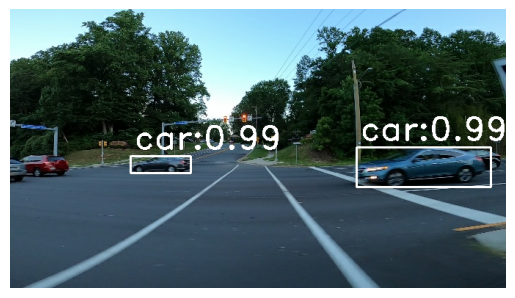

In [ ]:
draw_bounding_boxes(input_img, boxes, class_ids, confidences, labels, indicies)

In [ ]:
def pred_bbs(image: np.ndarray, threshold_probability: float=0.9, iou_threshold: float=0.5, labels: list=labels) -> None:
    """
    Perform object detection on an input image using a pre-trained neural network, and draw bounding boxes around detected objects.

    Args:
    - image: A numpy array representing the input image.
    - threshold_probability: A float representing the minimum probability threshold for a detected object to be considered valid. Defaults to 0.9.
    - iou_threshold: A float representing the intersection over union threshold for Non-Maximum Suppression (NMS). Defaults to 0.5.
    - labels: A list of strings representing the class labels for the detected objects. Defaults to the global 'labels' variable.

    Returns:
    - None.
    """

    # Convert image to blob
    blob = image_to_blob(image)

    # Make prediction
    net.setInput(blob)
    output_layers_names = net.getUnconnectedOutLayersNames()
    outputs = net.forward(output_layers_names)

    # Filter the inputs based on probability
    bboxes, confidences, class_ids = filter_output_probs(threshold_probability = threshold_probability, layer_outputs = outputs)

    # Apply Non Max Suppression
    indicies = cv.dnn.NMSBoxes(bboxes = bboxes, scores = confidences, score_threshold = threshold_probability, nms_threshold = iou_threshold)

    # Draw the Bounding Box
    draw_bounding_boxes(input_img = image, boxes = bboxes, class_ids = class_ids, confidences = confidences, labels = labels, indicies = indicies)

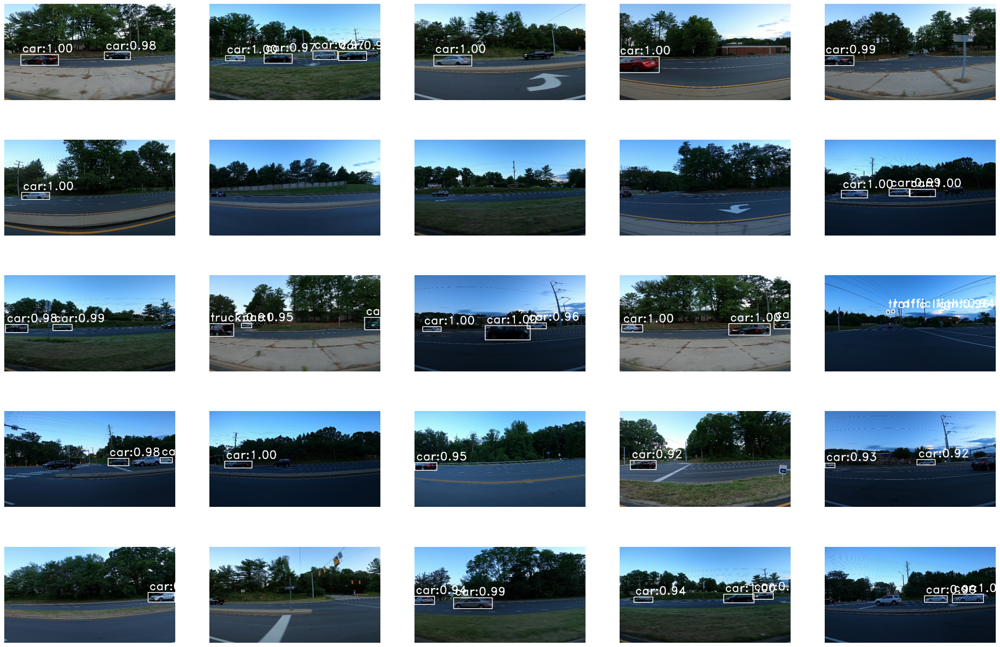

In [ ]:
# Constant
N_IMAGES = 25

def plot_random_images(images: np.ndarray) -> None:
    """
    Plots a grid of N_IMAGES random images along with the detected objects bounding boxes.

    Args:
    - images (np.ndarray): Array of images to plot.

    Returns:
    - None
    """

    # Plotting Configuration
    plt.figure(figsize=(30,20))

    # For n number of images
    for n in range(N_IMAGES):

        # Subplot
        plt.subplot(int(np.sqrt(N_IMAGES)), int(np.sqrt(N_IMAGES)), n+1)

        # Select Image Randomly
        image = images[np.random.randint(len(images))]

        # Detcted objects
        pred_bbs(image)

    # Show final plot
    plt.show()

# Plot images
plot_random_images(images)